In [1]:
import os
for dirname, _, filenames in os.walk('C:/Users/Aksha/Downloads/images'):
    print(dirname)

C:/Users/Aksha/Downloads/images


In [2]:
import numpy as np
import pandas as pd

In [3]:

import random
from PIL import Image # array to image
import urllib.request
from datasets import load_dataset

import datasets
from datasets import Dataset
import torch
from torchvision import transforms as T
from PIL import Image
from torch.utils.data import Dataset, DataLoader

import os
import pandas as pd
from torchvision.io import read_image



In [4]:
import accelerate
import transformers

transformers.__version__, accelerate.__version__

('4.34.1', '0.23.0')

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [6]:
# get from yolo file using pd.read_csv and save them in a numpy array
available_categories = {
    "0": 0, # dataset error
    "1": 1,
    "2": 2,
}

df_file_to_category = pd.DataFrame()

training_dir = r'C:/Users/Aksha/Downloads/images'

for dirname, _, filenames in os.walk(training_dir):
    for file in filenames:
        if not file.endswith("txt"):
            continue
        
        df_path = os.path.join(training_dir, file).replace("\\","/")
        
        image_classification_list = []
        
        if not os.path.getsize(df_path) == 0:
            # if file is not empty, i get only class data
            
            df = pd.read_csv(df_path, sep = " ", header=None)
            df.columns = ["label", "min_x", "min_y", "max_x", "max_y"]
            df["file"] = df_path
            # print(df.loc[:,["filename", "class"]])
            # print(df.loc[0,"filename"])
            
            # get all clasifications  
            image_classification_list = df.loc[:,"label"].tolist()
            
        # this this line i delete all of repeated numbers
        image_classification_list = [*set(image_classification_list)]
        
        categories = []
        for individual_classification in image_classification_list:
            categories.append(available_categories[str(individual_classification)])

        
        
        new_prediction = pd.Series(data={'file':df_path.replace('txt', 'jpg'), 'label':categories})
        df_file_to_category = pd.concat([df_file_to_category, new_prediction], axis=1)
        


In [7]:
df_file_to_category = df_file_to_category.T.reset_index(drop=True)

In [8]:
#if labels are empty or more than 1
df_file_to_category = df_file_to_category[df_file_to_category['label'].apply(lambda x: len(str(x).split(',')) < 2)]
#df_file_to_category = df_file_to_category[df_file_to_category['labels'].map(lambda x: len(str(x)) > 0 )]

df_file_to_category

,file,label
0,C:/Users/Aksha/Downloads/images/000002b97e5471...,[2]
1,C:/Users/Aksha/Downloads/images/00005bf623ff1a...,[0]
2,C:/Users/Aksha/Downloads/images/0000727e23603d...,[2]
3,C:/Users/Aksha/Downloads/images/000093534b14d3...,[2]
4,C:/Users/Aksha/Downloads/images/00009e5b390986...,[2]
...,...,...
5036,C:/Users/Aksha/Downloads/images/IMG_20181029_1...,[1]
5037,C:/Users/Aksha/Downloads/images/IMG_20181029_1...,[1]
5038,C:/Users/Aksha/Downloads/images/IMG_20181029_1...,[1]
5039,C:/Users/Aksha/Downloads/images/IMG_20181029_1...,[1]


In [9]:
df_file_to_category_blank_labels = df_file_to_category[df_file_to_category['label'].map(lambda x: len(str(x)) < 3 )]

df_file_to_category = df_file_to_category.drop(df_file_to_category_blank_labels.index, axis=0)

pd.set_option('display.max_colwidth', None)

df_file_to_category

,file,label
0,C:/Users/Aksha/Downloads/images/000002b97e5471a0.jpg,[2]
1,C:/Users/Aksha/Downloads/images/00005bf623ff1ac2.jpg,[0]
2,C:/Users/Aksha/Downloads/images/0000727e23603def.jpg,[2]
3,C:/Users/Aksha/Downloads/images/000093534b14d3f1.jpg,[2]
4,C:/Users/Aksha/Downloads/images/00009e5b390986a0.jpg,[2]
...,...,...
5036,C:/Users/Aksha/Downloads/images/IMG_20181029_154342 (1)_flipped.jpg,[1]
5037,C:/Users/Aksha/Downloads/images/IMG_20181029_154342.jpg,[1]
5038,C:/Users/Aksha/Downloads/images/IMG_20181029_154342_flipped.jpg,[1]
5039,C:/Users/Aksha/Downloads/images/IMG_20181029_154345.jpg,[1]


In [10]:
df_file_to_category["label"] = df_file_to_category["label"].str.get(0).astype(str)

df_file_to_category

,file,label
0,C:/Users/Aksha/Downloads/images/000002b97e5471a0.jpg,2
1,C:/Users/Aksha/Downloads/images/00005bf623ff1ac2.jpg,0
2,C:/Users/Aksha/Downloads/images/0000727e23603def.jpg,2
3,C:/Users/Aksha/Downloads/images/000093534b14d3f1.jpg,2
4,C:/Users/Aksha/Downloads/images/00009e5b390986a0.jpg,2
...,...,...
5036,C:/Users/Aksha/Downloads/images/IMG_20181029_154342 (1)_flipped.jpg,1
5037,C:/Users/Aksha/Downloads/images/IMG_20181029_154342.jpg,1
5038,C:/Users/Aksha/Downloads/images/IMG_20181029_154342_flipped.jpg,1
5039,C:/Users/Aksha/Downloads/images/IMG_20181029_154345.jpg,1


In [11]:
df_file_to_category.to_csv(r'C:\Users\Aksha\Downloads\dataset.csv', index=False)

In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

# move from 0 - 255 to 0 - 1
train_datagen = ImageDataGenerator(rescale=1/255)

train_dataset, validation_dataset = train_test_split(df_file_to_category, test_size=0.2)

# create flow from datagrame
train_generator = train_datagen.flow_from_dataframe(
    train_dataset,
    x_col='file',
    y_col='label',
    
    target_size=(224, 224),
    class_mode='categorical',
)

Found 3536 validated image filenames belonging to 3 classes.


In [13]:
train_dataset["label"].str.get(0).astype(str)
train_dataset

,file,label
3751,C:/Users/Aksha/Downloads/images/DOR_S3_69.jpg,0
785,C:/Users/Aksha/Downloads/images/02ac0be40e666e1d.jpg,0
2471,C:/Users/Aksha/Downloads/images/1a7b62286625d8c8.jpg,0
980,C:/Users/Aksha/Downloads/images/03cf0f0cf4ef646f.jpg,0
1954,C:/Users/Aksha/Downloads/images/0c41800d0c91812f.jpg,0
...,...,...
439,C:/Users/Aksha/Downloads/images/01092c3981578eb5.jpg,2
195,C:/Users/Aksha/Downloads/images/00375b73ec18722b.jpg,2
3712,C:/Users/Aksha/Downloads/images/DOR_S1_100.jpg,0
4751,C:/Users/Aksha/Downloads/images/IMG_20181029_145543 (1).jpg,1


In [14]:
# train_dataset["label"] = train_dataset["label"].apply(lambda x: list(map(int, x)))
# train_dataset

In [15]:
import cv2
from torchvision.transforms import v2

def get_thumbnail(path, ):
   # if is_grey_scale(path)==True:
       # print("yes")
     #   img = cv2.imread(path)
      #  if img.ndim==1:
     #       print(len(img.shape))
    #        print(path)
        #img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    
    #else:
        #print("NO")
        
        #img = cv2.imread(path)
    #    if img.ndim==1:
    #        print(len(img.shape))
    #        print(path)
        

    i = Image.open(path)
    #i = remove_transparency(i).convert('L')
    
    # transforms=T.Compose([
    # T.ToPILImage(),
    # T.Grayscale(),
    # T.Resize(size = (224,224)),
    # T.CenterCrop(224),
    # T.ToTensor(),
    # T.RandomHorizontalFlip(),
    # T.Normalize((0.5), (0.5))
    # ])
    # i = transforms(i)
    
    return i
    
def is_grey_scale(img_path):
        img = Image.open(img_path).convert('RGB')
        w, h = img.size
        for i in range(w):
            for j in range(h):
                r, g, b = img.getpixel((i,j))
                if r != g != b: 
                    return False
        return True
    

def remove_transparency(im, bg_colour=(255, 255, 255)):

    # Only process if image has transparency 
    if im.mode in ('RGBA', 'LA') or (im.mode == 'P' and 'transparency' in im.info):

        # Need to convert to RGBA if LA format due to a bug in PIL 
        alpha = im.convert('RGBA').split()[-1]

        # Create a new background image of our matt color.
        # Must be RGBA because paste requires both images have the same format

        bg = Image.new("RGBA", im.size, bg_colour + (255,))
        bg.paste(im, mask=alpha)
        return bg

    else:
        return im

        #transform = T.Compose([T.Resize(size = (224,224))])
        
        #resized_img = transform(i)

        

        #gray2rgb = convert_gray2rgb(numpydata)
    #numpydata = asarray(resized_img)

train_dataset['img'] = train_dataset.file.map(lambda f: get_thumbnail(f))
train_dataset

,file,label,img
3751,C:/Users/Aksha/Downloads/images/DOR_S3_69.jpg,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2723x4608 at 0x1C1070CA0D0>
785,C:/Users/Aksha/Downloads/images/02ac0be40e666e1d.jpg,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=768x1024 at 0x1C107104DD0>
2471,C:/Users/Aksha/Downloads/images/1a7b62286625d8c8.jpg,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=768x1024 at 0x1C1071062D0>
980,C:/Users/Aksha/Downloads/images/03cf0f0cf4ef646f.jpg,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x1024 at 0x1C1071067D0>
1954,C:/Users/Aksha/Downloads/images/0c41800d0c91812f.jpg,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=683x1024 at 0x1C107106CD0>
...,...,...,...
439,C:/Users/Aksha/Downloads/images/01092c3981578eb5.jpg,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x683 at 0x1C10AB003D0>
195,C:/Users/Aksha/Downloads/images/00375b73ec18722b.jpg,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x776 at 0x1C10AB00990>
3712,C:/Users/Aksha/Downloads/images/DOR_S1_100.jpg,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2286x4160 at 0x1C10AB00E50>
4751,C:/Users/Aksha/Downloads/images/IMG_20181029_145543 (1).jpg,1,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2080x1560 at 0x1C10AB01350>


In [16]:
train_dataset = train_dataset.drop('file', axis=1)
train_dataset

,label,img
3751,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2723x4608 at 0x1C1070CA0D0>
785,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=768x1024 at 0x1C107104DD0>
2471,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=768x1024 at 0x1C1071062D0>
980,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x1024 at 0x1C1071067D0>
1954,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=683x1024 at 0x1C107106CD0>
...,...,...
439,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x683 at 0x1C10AB003D0>
195,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x776 at 0x1C10AB00990>
3712,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2286x4160 at 0x1C10AB00E50>
4751,1,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2080x1560 at 0x1C10AB01350>


In [17]:
#converting labels to integers
train_dataset["label"] = [int(label) for label in train_dataset["label"]]

In [18]:
#train_dataset.reset_index().to_json(orient='records')
x = train_dataset.to_dict('list')
x

{'label': [0,
  0,
  0,
  0,
  0,
  2,
  1,
  0,
  2,
  0,
  0,
  2,
  1,
  0,
  1,
  0,
  2,
  1,
  2,
  0,
  2,
  1,
  0,
  2,
  1,
  2,
  2,
  2,
  0,
  1,
  2,
  2,
  0,
  0,
  1,
  0,
  1,
  1,
  0,
  2,
  0,
  1,
  0,
  2,
  0,
  1,
  0,
  0,
  2,
  2,
  1,
  2,
  2,
  0,
  0,
  0,
  0,
  2,
  1,
  1,
  1,
  2,
  0,
  1,
  1,
  1,
  0,
  0,
  2,
  0,
  1,
  2,
  1,
  0,
  1,
  2,
  1,
  1,
  2,
  2,
  0,
  1,
  0,
  1,
  0,
  2,
  2,
  2,
  0,
  1,
  1,
  1,
  1,
  2,
  1,
  2,
  0,
  2,
  0,
  0,
  1,
  1,
  1,
  2,
  2,
  0,
  0,
  0,
  1,
  1,
  0,
  2,
  2,
  2,
  1,
  1,
  0,
  0,
  1,
  2,
  2,
  0,
  1,
  0,
  0,
  2,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  2,
  2,
  2,
  1,
  2,
  1,
  2,
  0,
  0,
  2,
  0,
  0,
  2,
  0,
  2,
  2,
  2,
  2,
  0,
  0,
  0,
  1,
  2,
  0,
  1,
  2,
  2,
  0,
  0,
  2,
  1,
  0,
  0,
  2,
  1,
  0,
  0,
  0,
  2,
  1,
  0,
  0,
  1,
  0,
  1,
  1,
  2,
  0,
  2,
  2,
  1,
  0,
  2,
  2,
  0,
  2,
  1,
  1,
  2,
  1,
  2,
  1,
  1,
  1,
 

In [19]:
# for sub in x.get('label'):
#     for key in sub:
#         sub = int(key)
        
# x

In [20]:
# res = [{k: int(v) for k, v in d.items()} for d in map(lambda x: dict(x), name = y['label'])]
# res

In [21]:
# import ast
# def parse_webhook(webhook_data):

#     """
#     :param webhook_data: POST data from tradingview, as a string.
#     :return: Dictionary version of string.
#     """

#     data = ast.literal_eval(str(webhook_data))
#     return data

# y = parse_webhook(x['label'])
# y

In [22]:
from datasets import Dataset     
training_dataset = Dataset.from_dict(x)
training_dataset

Dataset({
    features: ['label', 'img'],
    num_rows: 3536
})

In [23]:
print(datasets.__version__)

2.14.7.dev0


In [24]:
validation_generator = train_datagen.flow_from_dataframe(
    validation_dataset,
    x_col='file',
    y_col='label',
    directory="C:/Users/Aksha/Downloads/images",
    target_size=(224, 224),
    class_mode='raw',
)

Found 885 validated image filenames.


In [25]:
def get_thumbnail(path):
    i = Image.open(path)
    #i = remove_transparency(i).convert('L')
    #data = np.asarray(i)
    # i = read_image(path)
    # transforms=T.Compose([
    # T.ToPILImage(),
    # T.Grayscale(),
    # T.Resize(size = (224,224)),
    # T.CenterCrop(224),
    # T.ToTensor(),
    # T.RandomHorizontalFlip(),
    # T.Normalize((0.5), (0.5))
    # ])
    # i = transforms(i)
    
    # create Pillow image
    #image2 = Image.fromarray(data)

    return i

validation_dataset['img'] = validation_dataset.file.map(lambda f: get_thumbnail(f))
validation_dataset

,file,label,img
4791,C:/Users/Aksha/Downloads/images/IMG_20181029_151358.jpg,1,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2304x1728 at 0x1C10AB41F90>
1379,C:/Users/Aksha/Downloads/images/062c692434673a62.jpg,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x677 at 0x1C10AB42050>
990,C:/Users/Aksha/Downloads/images/03db9d477ebed5a7.jpg,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x1024 at 0x1C10AB42150>
1805,C:/Users/Aksha/Downloads/images/08bf1cfa7858db0b.jpg,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x768 at 0x1C10AB42210>
3432,C:/Users/Aksha/Downloads/images/4 (24).jpg,1,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2304x1728 at 0x1C10AB422D0>
...,...,...,...
2312,C:/Users/Aksha/Downloads/images/150aab22bd56807e.jpg,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=682x1024 at 0x1C10BCDF550>
1483,C:/Users/Aksha/Downloads/images/06e34f96d9052d9e.jpg,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x768 at 0x1C10BCDFAD0>
774,C:/Users/Aksha/Downloads/images/029bb08956f906be.jpg,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x768 at 0x1C10BCE8090>
2324,C:/Users/Aksha/Downloads/images/1572e75ba770e631.jpg,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=768x1024 at 0x1C10BCE8550>


In [26]:
validation_dataset = validation_dataset.drop('file', axis=1)
validation_dataset

,label,img
4791,1,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2304x1728 at 0x1C10AB41F90>
1379,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x677 at 0x1C10AB42050>
990,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x1024 at 0x1C10AB42150>
1805,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x768 at 0x1C10AB42210>
3432,1,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2304x1728 at 0x1C10AB422D0>
...,...,...
2312,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=682x1024 at 0x1C10BCDF550>
1483,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x768 at 0x1C10BCDFAD0>
774,2,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x768 at 0x1C10BCE8090>
2324,0,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=768x1024 at 0x1C10BCE8550>


In [27]:
validation_dataset["label"] = [int(label) for label in validation_dataset["label"]]

In [28]:
#train_dataset.reset_index().to_json(orient='records')
y = validation_dataset.to_dict('list')
y

{'label': [1,
  2,
  2,
  2,
  1,
  0,
  0,
  2,
  2,
  1,
  2,
  2,
  1,
  1,
  0,
  0,
  0,
  0,
  1,
  2,
  0,
  2,
  2,
  0,
  1,
  0,
  2,
  1,
  2,
  0,
  0,
  1,
  2,
  2,
  0,
  2,
  2,
  1,
  2,
  0,
  2,
  0,
  0,
  2,
  0,
  0,
  1,
  1,
  1,
  2,
  0,
  1,
  0,
  2,
  0,
  2,
  1,
  0,
  2,
  0,
  0,
  1,
  0,
  0,
  2,
  2,
  2,
  2,
  0,
  2,
  1,
  2,
  2,
  0,
  2,
  1,
  0,
  2,
  2,
  0,
  2,
  2,
  0,
  2,
  2,
  1,
  1,
  0,
  0,
  0,
  1,
  0,
  0,
  2,
  1,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  1,
  1,
  1,
  2,
  1,
  2,
  0,
  2,
  0,
  1,
  1,
  1,
  1,
  2,
  1,
  2,
  1,
  2,
  2,
  2,
  0,
  1,
  2,
  1,
  0,
  0,
  2,
  1,
  2,
  1,
  1,
  2,
  1,
  2,
  1,
  2,
  0,
  2,
  1,
  0,
  0,
  1,
  2,
  1,
  2,
  0,
  2,
  2,
  0,
  1,
  0,
  1,
  0,
  1,
  2,
  2,
  1,
  0,
  2,
  1,
  1,
  2,
  2,
  0,
  0,
  2,
  2,
  0,
  2,
  0,
  2,
  2,
  1,
  2,
  1,
  1,
  0,
  1,
  2,
  0,
  2,
  2,
  0,
  2,
  2,
  2,
  1,
  0,
  0,
  0,
  1,
  2,
  2,
 

In [29]:
     
testing_dataset = Dataset.from_dict(y)
testing_dataset

Dataset({
    features: ['label', 'img'],
    num_rows: 885
})

In [30]:
#train_dataset = train_dataset.apply(lambda x: x.replace('"', ''))
#train_dataset

In [31]:
#import csv

#train_dataset.to_csv(r'C:\Users\Aksha\Downloads\train_dataset.csv', index=False)

In [32]:
#train_dataset = load_dataset('csv', data_files=r'C:\Users\Aksha\Downloads\train_dataset.csv', split = 'train', ignore_verifications=False)

#train_dataset

In [33]:
training_dataset[0]

{'label': 0,
 'img': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2723x4608>}

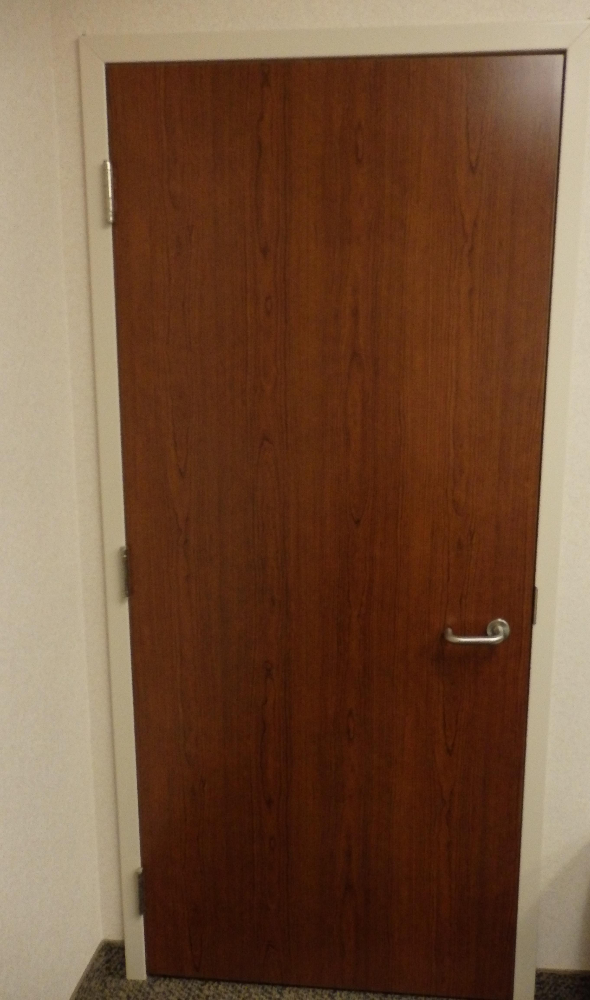

In [34]:
training_dataset['img'][0]

In [35]:
# n = []
# for i in train_dataset['img']:

#     #print( i.strip('\"'))
#     #i = i.replace('"', '')
#     n.append(i.lstrip('\"'))

# n[1]

In [36]:
# validation_dataset.to_csv(r'C:\Users\Aksha\Downloads\validation_dataset.csv', index=False)

In [37]:
# test_dataset = load_dataset('csv', data_files=r'C:\Users\Aksha\Downloads\validation_dataset.csv', split = 'train', ignore_verifications=False)

# test_dataset

In [38]:
set(training_dataset['label'])

{0, 1, 2}

In [39]:
num_classes = len(set(training_dataset['label']))
labels = set(training_dataset['label'])
num_classes, labels

(3, {0, 1, 2})

In [40]:
# train_dataset[0]

In [41]:
from transformers import ViTFeatureExtractor

# import model
model_id = 'google/vit-base-patch16-224-in21k'
feature_extractor = ViTFeatureExtractor.from_pretrained(
    model_id
)

C:\Users\Aksha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\models\vit\feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


In [42]:
feature_extractor

ViTFeatureExtractor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTFeatureExtractor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [43]:
example = feature_extractor(
    training_dataset['img'][0],
    return_tensors='pt'
)
example

{'pixel_values': tensor([[[[ 0.2627,  0.2549,  0.2549,  ...,  0.5843,  0.5922,  0.5922],
          [ 0.2627,  0.2627,  0.2627,  ...,  0.5922,  0.6000,  0.6078],
          [ 0.2784,  0.2784,  0.2863,  ...,  0.6000,  0.6000,  0.6000],
          ...,
          [ 0.3176,  0.3020,  0.3020,  ..., -0.8275, -0.8431, -0.8588],
          [ 0.2863,  0.2706,  0.2863,  ..., -0.8275, -0.8431, -0.8588],
          [ 0.2863,  0.2627,  0.2549,  ..., -0.8431, -0.8510, -0.8667]],

         [[ 0.1294,  0.1216,  0.1137,  ...,  0.4745,  0.4745,  0.4745],
          [ 0.1294,  0.1216,  0.1137,  ...,  0.4745,  0.4824,  0.4902],
          [ 0.1451,  0.1294,  0.1373,  ...,  0.4824,  0.4824,  0.4824],
          ...,
          [ 0.2078,  0.1843,  0.2000,  ..., -0.8745, -0.8824, -0.8980],
          [ 0.1765,  0.1686,  0.1843,  ..., -0.8745, -0.8745, -0.8902],
          [ 0.1765,  0.1686,  0.1608,  ..., -0.8902, -0.8824, -0.8902]],

         [[-0.0902, -0.1059, -0.1059,  ...,  0.3020,  0.3098,  0.3020],
          [-0

In [44]:
example['pixel_values'].shape

torch.Size([1, 3, 224, 224])

In [45]:
training_dataset[0]['img'].size

(2723, 4608)

In [46]:
def preprocess(batch):
    # take a list of PIL images and turn them to pixel values
    inputs = feature_extractor(
        batch['img'],
        return_tensors='pt'
    )
    # include the labels
    inputs['label'] = batch['label']
    return inputs

In [47]:
# transform the training dataset
prepared_train = training_dataset.with_transform(preprocess)
# ... and the testing dataset
prepared_test = testing_dataset.with_transform(preprocess)

Model Fine-Tuning

In [48]:
def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.tensor([x['label'] for x in batch])
    }

In [49]:
import numpy as np
from datasets import load_metric

# accuracy metric
metric = load_metric("accuracy")
def compute_metrics(p):
    return metric.compute(
        predictions=np.argmax(p.predictions, axis=1),
        references=p.label_ids
    )

C:\Users\Aksha\AppData\Local\Temp\ipykernel_21860\3243213926.py:5: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  metric = load_metric("accuracy")


In [50]:
from transformers import TrainingArguments
import transformers
import accelerate

training_args = TrainingArguments(
  output_dir=r"C:\Users\Aksha\Downloads\output",
  per_device_train_batch_size=16,
  evaluation_strategy="steps",
  num_train_epochs=4,
  save_steps=100,
  eval_steps=100,
  logging_steps=10,
  learning_rate=2e-4,
  save_total_limit=2,
  remove_unused_columns=False,
  push_to_hub=False,
  load_best_model_at_end=True,
)

In [51]:
import accelerate
import transformers

transformers.__version__, accelerate.__version__

('4.34.1', '0.23.0')

In [52]:
from transformers import ViTForImageClassification

labels = set(training_dataset['label'])
print(labels)
model = ViTForImageClassification.from_pretrained(
    model_id,  # classification head
    num_labels=len(labels)
)

{0, 1, 2}


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [53]:
model.to(device)

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=7

In [54]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=prepared_train,
    eval_dataset=prepared_test,
    tokenizer=feature_extractor,
)

In [55]:
metrics = trainer.evaluate(prepared_test)
trainer.log_metrics("eval", metrics)
trainer.save_metrics("eval", metrics)

ValueError: mean must have 1 elements if it is an iterable, got 3

Approach - 2 (Custom Vit)

In [16]:
# This cell reads the dataset from CSVs, if using the ImageFolder method, no need for this snippet. ImageFolder utilizes the classes based on the names of the folders.
# Refer https://www.youtube.com/watch?v=awyWND506NY&ab_channel=CodeWithAarohi for more information about the implementation

class CustomImageDataset(Dataset):
    def __init__(self, annotations_file, img_dir, transform=T.Compose([T.Resize(size = (224,224)), T.Grayscale()]), target_transform=None):
        self.img_labels = pd.read_csv(annotations_file)
        self.img_dir = img_dir
        self.transform = transform
        
        self.target_transform = target_transform

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_labels.iloc[idx, 0])
        image = read_image(img_path)
        
        label = self.img_labels.iloc[idx, 1]
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label

# Create a PyTorch DataLoader object
train_dataset = CustomImageDataset(r'C:\Users\Aksha\Downloads\train_dataset.csv',r'C:\Users\Aksha\Downloads\images')
validation_dataset = CustomImageDataset(r'C:\Users\Aksha\Downloads\validation_dataset.csv',r'C:\Users\Aksha\Downloads\images')

train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
validation_dataloader = DataLoader(validation_dataset, batch_size=32, shuffle=True)

In [17]:
train_dataset[1]

C:\Users\Aksha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


(tensor([[[111, 117, 118,  ..., 127, 125, 105],
          [111, 113, 118,  ..., 125, 124, 108],
          [107, 117, 119,  ..., 125, 125, 111],
          ...,
          [ 40,  36,  43,  ...,  44,  22,  41],
          [ 33,  39,  35,  ...,  43,  43,  39],
          [ 43,  38,  37,  ...,  48,  39,  42]]], dtype=torch.uint8),
 '[2]')

In [18]:
next(iter(train_dataloader))

[tensor([[[[ 85,  93,  92,  ..., 140, 126, 124],
           [ 88,  82,  96,  ..., 156, 158, 149],
           [ 90,  97,  97,  ..., 158, 143, 154],
           ...,
           [ 95,  89,  91,  ...,  92,  83,  87],
           [ 78,  91,  89,  ...,  89,  94,  94],
           [ 80,  82,  86,  ..., 108,  92,  91]]],
 
 
         [[[178, 152, 145,  ..., 107, 108, 107],
           [180, 156, 150,  ..., 102, 106, 106],
           [181, 153, 143,  ..., 126, 112, 106],
           ...,
           [ 30,  32,  37,  ...,  29,  35,  29],
           [ 33,  36,  34,  ...,  43,  30,  34],
           [ 26,  27,  28,  ...,  38,  68,  48]]],
 
 
         [[[ 91,  92,  93,  ..., 192, 190, 190],
           [ 77,  78,  75,  ..., 193, 194, 193],
           [ 78,  81,  84,  ..., 197, 195, 208],
           ...,
           [ 91,  91,  91,  ...,  80,  80,  80],
           [ 87,  90,  92,  ...,  79,  80,  79],
           [ 89,  87,  90,  ...,  80,  79,  78]]],
 
 
         ...,
 
 
         [[[ 21,  25,  27,  ..., 1

In [57]:
# train_dataloader = DataLoader(training_dataset, batch_size=32, shuffle=True)
# validation_dataloader = DataLoader(testing_dataset, batch_size=32, shuffle=True)

In [58]:

image_batch, label_batch = next(iter(train_dataloader))

#transforms.Resize(size = (224,224))(image_batch)

# Get a single image from the batch
image, label = image_batch[0], label_batch[0]

# View the batch shapes
print(image.shape, label)

# Plot image with matplotlib
plt.imshow(image.permute(1, 2, 0)) # rearrange image dimensions to suit matplotlib [color_channels, height, width] -> [height, width, color_channels]

plt.axis(False);

TypeError: default_collate: batch must contain tensors, numpy arrays, numbers, dicts or lists; found <class 'PIL.JpegImagePlugin.JpegImageFile'>

In [20]:
set(label_batch)

{'[0]', '[1]', '[2]'}

In [21]:
from torch import nn

# 1. Create a class which subclasses nn.Module
class PatchEmbedding(nn.Module):
    """Turns a 2D input image into a 1D sequence learnable embedding vector.
    
    Args:
        in_channels (int): Number of color channels for the input images. Defaults to 3.
        patch_size (int): Size of patches to convert input image into. Defaults to 16.
        embedding_dim (int): Size of embedding to turn image into. Defaults to 768.
    """ 
    # 2. Initialize the class with appropriate variables
    def __init__(self, 
                 in_channels:int=1,
                 patch_size:int=16,
                 embedding_dim:int=768):
        super().__init__()
        
        # 3. Create a layer to turn an image into patches
        self.patcher = nn.Conv2d(in_channels=in_channels,
                                 out_channels=embedding_dim,
                                 kernel_size=patch_size,
                                 stride=patch_size,
                                 padding=0)

        # 4. Create a layer to flatten the patch feature maps into a single dimension
        self.flatten = nn.Flatten(start_dim=2, # only flatten the feature map dimensions into a single vector
                                  end_dim=3)

    # 5. Define the forward method 
    def forward(self, x):
        # Create assertion to check that inputs are the correct shape
        image_resolution = x.shape[-1]
        assert image_resolution % patch_size == 0, f"Input image size must be divisble by patch size, image shape: {image_resolution}, patch size: {patch_size}"
        
        # Perform the forward pass
        x_patched = self.patcher(x.to(torch.float))
        x_flattened = self.flatten(x_patched) 
        
        # 6. Make sure the output shape has the right order 
        return x_flattened.permute(0, 2, 1) # adjust so the embedding is on the final dimension [batch_size, P^2•C, N] -> [batch_size, N, P^2•C]

In [22]:
# Let's test it on single image
patch_size =16

# Set seeds
def set_seeds(seed: int=42):
    """Sets random sets for torch operations.

    Args:
        seed (int, optional): Random seed to set. Defaults to 42.
    """
    # Set the seed for general torch operations
    torch.manual_seed(seed)
    # Set the seed for CUDA torch operations (ones that happen on the GPU)
    torch.cuda.manual_seed(seed)
    
    
    
set_seeds()

# Create an instance of patch embedding layer
patchify = PatchEmbedding(in_channels=1,
                          patch_size=16,
                          embedding_dim=768)

# Pass a single image through
print(f"Input image shape: {image.unsqueeze(0).shape}")

#converting values to float using torch.float else gives error Input type (unsigned char) and bias type (float) should be the same
patch_embedded_image = patchify(image.to(torch.float).unsqueeze(0)) # add an extra batch dimension on the 0th index, otherwise will error
print(f"Output patch embedding shape: {patch_embedded_image.shape}")

Input image shape: torch.Size([1, 1, 224, 224])
Output patch embedding shape: torch.Size([1, 196, 768])


In [23]:
# View the patch embedding and patch embedding shape

print(patch_embedded_image) 
print(f"Patch embedding shape: {patch_embedded_image.shape} -> [batch_size, number_of_patches, embedding_dimension]")

tensor([[[-203.0541, -135.7924,  -88.3863,  ...,   38.9547,   32.6048,
            57.9030],
         [ -99.0265,  -56.7727,  -41.8374,  ...,    4.6234,   10.6640,
            52.6662],
         [-141.1332,  -90.2796,  -46.4556,  ...,   24.8285,   12.1986,
            47.1661],
         ...,
         [-101.2341,  -76.9272,  -21.9397,  ...,   17.5987,    6.8015,
            33.0214],
         [ -79.0473,  -67.3587,  -24.3527,  ...,   18.9340,    6.2736,
            21.5867],
         [-136.3870,  -81.1167,  -28.8615,  ...,   10.2398,   15.2223,
            51.1047]]], grad_fn=<PermuteBackward0>)
Patch embedding shape: torch.Size([1, 196, 768]) -> [batch_size, number_of_patches, embedding_dimension]


In [24]:
# Now add the the learnable class embedding and position embeddings
# From start to positional encoding: All in 1 cell

set_seeds()

# 1. Set patch size
patch_size = 16

# 2. Print shape of original image tensor and get the image dimensions
print(f"Image tensor shape: {image.shape}")
height, width = image.shape[1], image.shape[2]

# 3. Get image tensor and add batch dimension
x = image.to(torch.float).unsqueeze(0)
print(f"Input image with batch dimension shape: {x.shape}")

# 4. Create patch embedding layer
patch_embedding_layer = PatchEmbedding(in_channels=1,
                                       patch_size=patch_size,
                                       embedding_dim=768)

# 5. Pass image through patch embedding layer
patch_embedding = patch_embedding_layer(x)
print(f"Patching embedding shape: {patch_embedding.shape}")



# 6. Create class token embedding
batch_size = patch_embedding.shape[0]
embedding_dimension = patch_embedding.shape[-1]
class_token = nn.Parameter(torch.ones(batch_size, 1, embedding_dimension),
                           requires_grad=True) # make sure it's learnable
print(f"Class token embedding shape: {class_token.shape}")

# 7. Prepend class token embedding to patch embedding
patch_embedding_class_token = torch.cat((class_token, patch_embedding), dim=1)
print(f"Patch embedding with class token shape: {patch_embedding_class_token.shape}")

# 8. Create position embedding
number_of_patches = int((height * width) / patch_size**2)
position_embedding = nn.Parameter(torch.ones(1, number_of_patches+1, embedding_dimension),
                                  requires_grad=True) # make sure it's learnable


# 9. Add position embedding to patch embedding with class token
patch_and_position_embedding = patch_embedding_class_token + position_embedding
print(f"Patch and position embedding shape: {patch_and_position_embedding.shape}")
#patch_and_position_embedding

print(patch_embedding_class_token)  #1 is added in the beginning of each

Image tensor shape: torch.Size([1, 224, 224])
Input image with batch dimension shape: torch.Size([1, 1, 224, 224])
Patching embedding shape: torch.Size([1, 196, 768])
Class token embedding shape: torch.Size([1, 1, 768])
Patch embedding with class token shape: torch.Size([1, 197, 768])
Patch and position embedding shape: torch.Size([1, 197, 768])
tensor([[[   1.0000,    1.0000,    1.0000,  ...,    1.0000,    1.0000,
             1.0000],
         [-203.0541, -135.7924,  -88.3863,  ...,   38.9547,   32.6048,
            57.9030],
         [ -99.0265,  -56.7727,  -41.8374,  ...,    4.6234,   10.6640,
            52.6662],
         ...,
         [-101.2341,  -76.9272,  -21.9397,  ...,   17.5987,    6.8015,
            33.0214],
         [ -79.0473,  -67.3587,  -24.3527,  ...,   18.9340,    6.2736,
            21.5867],
         [-136.3870,  -81.1167,  -28.8615,  ...,   10.2398,   15.2223,
            51.1047]]], grad_fn=<CatBackward0>)


In [57]:
# 1. Create a class that inherits from nn.Module
class MultiheadSelfAttentionBlock(nn.Module):
    """Creates a multi-head self-attention block ("MSA block" for short).
    """
    # 2. Initialize the class with hyperparameters from Table 1
    def __init__(self,
                 embedding_dim:int=768, # Hidden size D from Table 1 for ViT-Base
                 num_heads:int=12, # Heads from Table 1 for ViT-Base
                 attn_dropout:float=0): # doesn't look like the paper uses any dropout in MSABlocks
        super().__init__()
        
        # 3. Create the Norm layer (LN)
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)
        
        # 4. Create the Multi-Head Attention (MSA) layer
        self.multihead_attn = nn.MultiheadAttention(embed_dim=embedding_dim,
                                                    num_heads=num_heads,
                                                    dropout=attn_dropout,
                                                    batch_first=True) # does our batch dimension come first?
        
    # 5. Create a forward() method to pass the data throguh the layers
    def forward(self, x):
        x = self.layer_norm(x)
        attn_output, _ = self.multihead_attn(query=x, # query embeddings 
                                             key=x, # key embeddings
                                             value=x, # value embeddings
                                             need_weights=False) # do we need the weights or just the layer outputs?
        return attn_output

In [58]:
# 1. Create a class that inherits from nn.Module
class MLPBlock(nn.Module):
    """Creates a layer normalized multilayer perceptron block ("MLP block" for short)."""
    # 2. Initialize the class with hyperparameters from Table 1 and Table 3
    def __init__(self,
                 embedding_dim:int=768, # Hidden Size D from Table 1 for ViT-Base
                 mlp_size:int=3072, # MLP size from Table 1 for ViT-Base
                 dropout:float=0.1): # Dropout from Table 3 for ViT-Base
        super().__init__()
        
        # 3. Create the Norm layer (LN)
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)
        
        # 4. Create the Multilayer perceptron (MLP) layer(s)
        self.mlp = nn.Sequential(
            nn.Linear(in_features=embedding_dim,
                      out_features=mlp_size),
            nn.GELU(), # "The MLP contains two layers with a GELU non-linearity (section 3.1)."
            nn.Dropout(p=dropout),
            nn.Linear(in_features=mlp_size, # needs to take same in_features as out_features of layer above
                      out_features=embedding_dim), # take back to embedding_dim
            nn.Dropout(p=dropout) # "Dropout, when used, is applied after every dense layer.."
        )
    
    # 5. Create a forward() method to pass the data throguh the layers
    def forward(self, x):
        x = self.layer_norm(x)
        x = self.mlp(x)
        return x

In [59]:
# 1. Create a class that inherits from nn.Module
class TransformerEncoderBlock(nn.Module):
    """Creates a Transformer Encoder block."""
    # 2. Initialize the class with hyperparameters from Table 1 and Table 3
    def __init__(self,
                 embedding_dim:int=768, # Hidden size D from Table 1 for ViT-Base
                 num_heads:int=12, # Heads from Table 1 for ViT-Base
                 mlp_size:int=3072, # MLP size from Table 1 for ViT-Base
                 mlp_dropout:float=0.1, # Amount of dropout for dense layers from Table 3 for ViT-Base
                 attn_dropout:float=0): # Amount of dropout for attention layers
        super().__init__()

        # 3. Create MSA block (equation 2)
        self.msa_block = MultiheadSelfAttentionBlock(embedding_dim=embedding_dim,
                                                     num_heads=num_heads,
                                                     attn_dropout=attn_dropout)
        
        # 4. Create MLP block (equation 3)
        self.mlp_block =  MLPBlock(embedding_dim=embedding_dim,
                                   mlp_size=mlp_size,
                                   dropout=mlp_dropout)
        
    # 5. Create a forward() method  
    def forward(self, x):
        
        # 6. Create residual connection for MSA block (add the input to the output)
        x =  self.msa_block(x) + x 
        
        # 7. Create residual connection for MLP block (add the input to the output)
        x = self.mlp_block(x) + x 
        
        return x

In [60]:
transformer_encoder_block = TransformerEncoderBlock()

from torchinfo import summary
# # Print an input and output summary of our Transformer Encoder (uncomment for full output)
summary(model=transformer_encoder_block,
        input_size=(1, 197, 768), # (batch_size, num_patches, embedding_dimension)
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
       row_settings=["var_names"])

Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
TransformerEncoderBlock (TransformerEncoderBlock)  [1, 197, 768]        [1, 197, 768]        --                   True
├─MultiheadSelfAttentionBlock (msa_block)          [1, 197, 768]        [1, 197, 768]        --                   True
│    └─LayerNorm (layer_norm)                      [1, 197, 768]        [1, 197, 768]        1,536                True
│    └─MultiheadAttention (multihead_attn)         --                   [1, 197, 768]        2,362,368            True
├─MLPBlock (mlp_block)                             [1, 197, 768]        [1, 197, 768]        --                   True
│    └─LayerNorm (layer_norm)                      [1, 197, 768]        [1, 197, 768]        1,536                True
│    └─Sequential (mlp)                            [1, 197, 768]        [1, 197, 768]        --                   True
│    │    └─Linear (0)                     

In [61]:
# 1. Create a ViT class that inherits from nn.Module
class ViT(nn.Module):
    """Creates a Vision Transformer architecture with ViT-Base hyperparameters by default."""
    # 2. Initialize the class with hyperparameters from Table 1 and Table 3
    def __init__(self,
                 img_size:int=224, # Training resolution from Table 3 in ViT paper
                 in_channels:int=1, # Number of channels in input image
                 patch_size:int=16, # Patch size
                 num_transformer_layers:int=12, # Layers from Table 1 for ViT-Base
                 embedding_dim:int=768, # Hidden size D from Table 1 for ViT-Base
                 mlp_size:int=3072, # MLP size from Table 1 for ViT-Base
                 num_heads:int=12, # Heads from Table 1 for ViT-Base
                 attn_dropout:float=0, # Dropout for attention projection
                 mlp_dropout:float=0.1, # Dropout for dense/MLP layers 
                 embedding_dropout:float=0.1, # Dropout for patch and position embeddings
                 num_classes:int=1000): # Default for ImageNet but can customize this
        super().__init__() # don't forget the super().__init__()!
        
        # 3. Make the image size is divisble by the patch size 
        assert img_size % patch_size == 0, f"Image size must be divisible by patch size, image size: {img_size}, patch size: {patch_size}."
        
        # 4. Calculate number of patches (height * width/patch^2)
        self.num_patches = (img_size * img_size) // patch_size**2
                 
        # 5. Create learnable class embedding (needs to go at front of sequence of patch embeddings)
        self.class_embedding = nn.Parameter(data=torch.randn(1, 1, embedding_dim),
                                            requires_grad=True)
        
        # 6. Create learnable position embedding
        self.position_embedding = nn.Parameter(data=torch.randn(1, self.num_patches+1, embedding_dim),
                                               requires_grad=True)
                
        # 7. Create embedding dropout value
        self.embedding_dropout = nn.Dropout(p=embedding_dropout)
        
        # 8. Create patch embedding layer
        self.patch_embedding = PatchEmbedding(in_channels=in_channels,
                                              patch_size=patch_size,
                                              embedding_dim=embedding_dim)
        
        # 9. Create Transformer Encoder blocks (we can stack Transformer Encoder blocks using nn.Sequential()) 
        # Note: The "*" means "all"
        self.transformer_encoder = nn.Sequential(*[TransformerEncoderBlock(embedding_dim=embedding_dim,
                                                                            num_heads=num_heads,
                                                                            mlp_size=mlp_size,
                                                                            mlp_dropout=mlp_dropout) for _ in range(num_transformer_layers)])
       
        # 10. Create classifier head
        self.classifier = nn.Sequential(
            nn.LayerNorm(normalized_shape=embedding_dim),
            nn.Linear(in_features=embedding_dim, 
                      out_features=num_classes)
        )
    
    # 11. Create a forward() method
    def forward(self, x):
        
        # 12. Get batch size
        batch_size = x.shape[0]
        
        # 13. Create class token embedding and expand it to match the batch size (equation 1)
        class_token = self.class_embedding.expand(batch_size, -1, -1) # "-1" means to infer the dimension (try this line on its own)

        # 14. Create patch embedding (equation 1)
        x = self.patch_embedding(x)

        # 15. Concat class embedding and patch embedding (equation 1)
        x = torch.cat((class_token, x), dim=1)

        # 16. Add position embedding to patch embedding (equation 1) 
        x = self.position_embedding + x

        # 17. Run embedding dropout (Appendix B.1)
        x = self.embedding_dropout(x)

        # 18. Pass patch, position and class embedding through transformer encoder layers (equations 2 & 3)
        x = self.transformer_encoder(x)

        # 19. Put 0 index logit through classifier (equation 4)
        x = self.classifier(x[:, 0]) # run on each sample in a batch at 0 index

        return x       

In [62]:
# Train our MOdel

# Create an instance of ViT with the number of classes we're working with (windows, doors and stairs)
vit = ViT(num_classes=3)

In [63]:
from going_modular.going_modular import engine
# Setup the optimizer to optimize our ViT model parameters using hyperparameters from the ViT paper 
optimizer = torch.optim.Adam(params=vit.parameters(), 
                             lr=3e-3, # Base LR from Table 3 for ViT-* ImageNet-1k
                             betas=(0.9, 0.999), # default values but also mentioned in ViT paper section 4.1 (Training & Fine-tuning)
                             weight_decay=0.3) # from the ViT paper section 4.1 (Training & Fine-tuning) and Table 3 for ViT-* ImageNet-1k

# Setup the loss function for multi-class classification
loss_fn = torch.nn.CrossEntropyLoss()

# Set the seeds
set_seeds()

# Train the model and save the training results to a dictionary
results = engine.train(model=vit,
                       train_dataloader=train_dataloader,
                       test_dataloader=validation_dataloader,
                    
                       optimizer=optimizer,
                       loss_fn=loss_fn,
                       epochs=5,
                       device=device)

  0%|          | 0/5 [00:00<?, ?it/s]

IndexError: Target 3 is out of bounds.

In [64]:
set(label_batch)

{'[0]', '[1]', '[2]'}

In [68]:
image_batch.shape

torch.Size([1, 3, 1560, 2080])

In [26]:
# Display image and label.
train_features, train_labels = next(iter(dataloader))
print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")
img = train_features[0].squeeze()
label = train_labels[0]
plt.imshow(img, cmap="gray")
plt.show()
print(f"Label: {label}")

TypeError: join() argument must be str, bytes, or os.PathLike object, not 'int64'

In [6]:
#df_file_to_categoryx = df_file_to_category.reset_index(level=['filename', 'labels'])
df_file_to_category = df_file_to_category.T.reset_index(drop=True)

pd.set_option('display.max_colwidth', None)
df_file_to_category.info()
df_file_to_category.sample(7)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5044 entries, 0 to 5043
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  5044 non-null   object
 1   labels    5044 non-null   object
dtypes: object(2)
memory usage: 78.9+ KB


,filename,labels
3681,C:/Users/Aksha/Downloads/images\99ad5ee7015e4fbd.jpg,[door]
4742,C:/Users/Aksha/Downloads/images\IMG_20181029_145536.jpg,[stairs]
1626,C:/Users/Aksha/Downloads/images\07b2d6e1af939bac.jpg,[window]
1035,C:/Users/Aksha/Downloads/images\042e4600ff558ca1.jpg,[window]
1482,C:/Users/Aksha/Downloads/images\06e25b6dc4f6a241.jpg,[window]
4781,C:/Users/Aksha/Downloads/images\IMG_20181029_151352_flipped.jpg,[stairs]
4890,C:/Users/Aksha/Downloads/images\IMG_20181029_151821.jpg,[stairs]


In [7]:
df_file_to_category.info()
df_file_to_category.sample(7)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5044 entries, 0 to 5043
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  5044 non-null   object
 1   labels    5044 non-null   object
dtypes: object(2)
memory usage: 78.9+ KB


,filename,labels
11,C:/Users/Aksha/Downloads/images\00010bf498b64bab.jpg,[window]
495,C:/Users/Aksha/Downloads/images\013bfc21cf1b9341.jpg,[window]
616,C:/Users/Aksha/Downloads/images\01c8fc9fa7b8e5e6.jpg,[window]
1540,C:/Users/Aksha/Downloads/images\074fb373fa5af35c.jpg,[window]
3316,C:/Users/Aksha/Downloads/images\3a6f614581b114cd.jpg,[door]
2273,C:/Users/Aksha/Downloads/images\142ec8f1e388fcb6.jpg,[door]
102,C:/Users/Aksha/Downloads/images\000f2c1e2c9e0355.jpg,[window]


In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

# move from 0 - 255 to 0 - 1
train_datagen = ImageDataGenerator(rescale=1/255)

train_dataset, validation_dataset = train_test_split(df_file_to_category, test_size=0.2)

# create flow from datagrame
train_generator = train_datagen.flow_from_dataframe(
    train_dataset,
    x_col='filename',
    y_col='labels',
    #directory="/kaggle/input/dwsonder/images",
    target_size=(250, 250),
    class_mode='categorical',
)

Found 4031 validated image filenames belonging to 3 classes.


C:\Users\Aksha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\preprocessing\image.py:1137: UserWarning: Found 4 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


In [9]:
validation_generator = train_datagen.flow_from_dataframe(
    validation_dataset,
    x_col='filename',
    y_col='labels',
    directory="C:/Users/Aksha/Downloads/images",
    target_size=(250, 250),
    class_mode='raw',
)

Found 1008 validated image filenames.


C:\Users\Aksha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\preprocessing\image.py:1137: UserWarning: Found 1 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


In [10]:
validation_dataset

,filename,labels
4213,C:/Users/Aksha/Downloads/images\IMG_20181004_175456_flipped.jpg,[stairs]
2795,C:/Users/Aksha/Downloads/images\268640ba24e36818.jpg,[door]
2869,C:/Users/Aksha/Downloads/images\291d2d5b44fb1f45.jpg,[door]
4705,C:/Users/Aksha/Downloads/images\IMG_20181029_144331_flipped.jpg,[stairs]
2180,C:/Users/Aksha/Downloads/images\114c03dff2b5cd94.jpg,[door]
...,...,...
3699,C:/Users/Aksha/Downloads/images\c1673594e5ca4212.jpg,[]
1016,C:/Users/Aksha/Downloads/images\0403ad4a4cfc3d3d.jpg,[window]
389,C:/Users/Aksha/Downloads/images\00d8400b6ecba5f2.jpg,[window]
4210,C:/Users/Aksha/Downloads/images\IMG_20181004_175454.jpg,[stairs]


In [11]:
train_dataset

,filename,labels
4556,C:/Users/Aksha/Downloads/images\IMG_20181029_143445.jpg,[stairs]
2701,C:/Users/Aksha/Downloads/images\235a6f5eb53515d0.jpg,[door]
1025,C:/Users/Aksha/Downloads/images\041900cf329d9e48.jpg,[window]
3508,C:/Users/Aksha/Downloads/images\4267079863bd27fa.jpg,[window]
4045,C:/Users/Aksha/Downloads/images\IMG_20181004_171439_flipped.jpg,[stairs]
...,...,...
1353,C:/Users/Aksha/Downloads/images\05f98613a5f083d6.jpg,[]
4443,C:/Users/Aksha/Downloads/images\IMG_20181029_142716_flipped.jpg,[stairs]
2249,C:/Users/Aksha/Downloads/images\139e4324cb71b3a8.jpg,[door]
1532,C:/Users/Aksha/Downloads/images\07469609f7e47e33.jpg,[window]


In [12]:
model = Sequential([
    Conv2D(16, (3, 3), activation="relu",
          input_shape=(250, 250, 3)),
    MaxPooling2D(2, 2),
    
    Conv2D(32, (3, 3), activation="relu"),
    MaxPooling2D(2, 2),
    
    Conv2D(64, (3, 3), activation="relu"),
    MaxPooling2D(2, 2),
    
    Conv2D(64, (3, 3), activation="relu"),
    MaxPooling2D(2, 2),
    
    Flatten(),
    Dense(40, activation="relu"),
    Dense(2, activation="sigmoid"),
])

In [13]:
from tensorflow.keras.optimizers import RMSprop

model.compile(
    loss="categorical_crossentropy",
    optimizer=RMSprop(learning_rate=0.001),
    #optimizer=tf.keras.optimizers.Adam(
    #    learning_rate=0.001,
    #),
    metrics=["accuracy"],
)

In [14]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

In [15]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [6]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import scipy.io
import shutil

C:\Users\Aksha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
C:\Users\Aksha\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.11.0 and strictly below 2.14.0 (nightly versions are not supported). 
 The versions of Tens

In [10]:
path_images = r'C:\\Users\\Aksha\\Downloads\\images\\'
path_annot = r'C:\\Users\\Aksha\\Downloads\\annotations\\'

# list of paths to images and annotations
image_paths = [
    f for f in os.listdir(path_images) if os.path.isfile(os.path.join(path_images, f))
]
annot_paths = [
    f for f in os.listdir(path_annot) if os.path.isfile(os.path.join(path_annot, f))
]

image_paths.sort()
annot_paths.sort()

image_size = 224  # resize input images to this size

images, targets = [], []

# loop over the annotations and images, preprocess them and store in lists
for i in range(0, len(annot_paths)):
    # Access bounding box coordinates
    annot = np.loadtxt(path_annot + annot_paths[i])["box_coord"][0]

    top_left_x, top_left_y = annot[2], annot[0]
    bottom_right_x, bottom_right_y = annot[3], annot[1]

    image = keras.utils.load_img(
        path_images + image_paths[i],
    )
    (w, h) = image.size[:2]

    # resize train set images
    if i < int(len(annot_paths) * 0.8):
        # resize image if it is for training dataset
        image = image.resize((image_size, image_size))

    # convert image to array and append to list
    images.append(keras.utils.img_to_array(image))

    # apply relative scaling to bounding boxes as per given image and append to list
    targets.append(
        (
            float(top_left_x) / w,
            float(top_left_y) / h,
            float(bottom_right_x) / w,
            float(bottom_right_y) / h,
        )
    )

# Convert the list to numpy array, split to train and test dataset
(x_train), (y_train) = (
    np.asarray(images[: int(len(images) * 0.8)]),
    np.asarray(targets[: int(len(targets) * 0.8)]),
)
(x_test), (y_test) = (
    np.asarray(images[int(len(images) * 0.8) :]),
    np.asarray(targets[int(len(targets) * 0.8) :]),
)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [62]:
files = 'C://Users//Aksha//Downloads//annotations//*.txt'
files


'C:/Users/Aksha/Downloads/annotations/*.txt'

In [9]:
import scipy.io
mat = scipy.io.loadmat('C:\\Users\\Aksha\\Downloads\\caltech-101\\Annotations\\Annotations\\barrel\\annotation_0002.mat')
mat

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN, Created on: Wed Dec 15 11:28:34 2004',
 '__version__': '1.0',
 '__globals__': [],
 'box_coord': array([[ 42, 247,  34, 189]], dtype=uint8),
 'obj_contour': array([[ 16.88070175,  34.95087719,  63.14035088, 101.44912281,
         137.58947368, 148.07017544, 145.17894737, 139.39649123,
         146.6245614 , 151.68421053, 149.51578947, 143.37192982,
         134.69824561, 111.92982456,  84.10175439,  55.18947368,
          24.83157895,  18.32631579,   8.56842105,   8.20701754,
           8.20701754,  13.26666667,  20.13333333,  15.07368421,
          15.07368421,  18.6877193 ,  18.6877193 ],
        [  7.90877193,   3.21052632,   3.57192982,   3.93333333,
           7.18596491,  10.8       ,  17.66666667,  18.02807018,
          46.57894737,  75.49122807, 124.28070175, 160.05964912,
         184.27368421, 196.92280702, 199.81403509, 198.72982456,
         188.61052632, 175.96140351, 138.3754386 , 102.95789474,
          62.11929825, 

In [24]:

# Define relative path to folder containing the text files

files_folder = "C:/Users/Aksha/Downloads/annotations/"
files = []

# Create a dataframe list by using a list comprehension

files = [pd.read_csv(file, delimiter='\t', names =['content', 'first', 'second'] ) for file in glob.glob(os.path.join(files_folder ,"*.txt"))]

# Concatenate the list of DataFrames into one
files_df = pd.concat(files)

In [25]:
files_df

,content,first,second
0,2 0.96728515625 0.5 0.0126953125 0.0234375,NaN,NaN
1,2 0.98095703125 0.546875 0.0263671875 0.049479...,NaN,NaN
2,2 0.98876953125 0.48697916666666663 0.02050781...,NaN,NaN
0,0 0.28515625 0.42888563049853373 0.140625 0.5,NaN,NaN
0,2 0.845703125 0.05403645833333333 0.08203125 0...,NaN,NaN
...,...,...,...
0,1 0.2789663461538462 0.4081730769230769 0.5579...,NaN,NaN
0,1 0.7236778846153846 0.3658653846153846 0.5526...,NaN,NaN
0,1 0.2763221153846154 0.3658653846153846 0.5526...,NaN,NaN
0,1 0.478515625 0.4497974537037037 0.19618055555...,NaN,NaN
